In [ ]:
from google.colab import drive

In [ ]:
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import os
import cv2
import numpy as np
from keras.preprocessing.image import ImageDataGenerator

# Specify the path to the folder containing your TIFF images
folder_path = "/content/drive/My Drive/ad/work"

# Check if the directory exists
if not os.path.exists(folder_path):
    print(f"The specified directory '{folder_path}' does not exist. Please provide a valid path.")
else:
    print(type(folder_path))
    print(folder_path)

    # Output directory for augmented images
    output_path = '/content/drive/MyDrive/ad/make'
    os.makedirs(output_path, exist_ok=True)

    # Create an ImageDataGenerator
    datagen = ImageDataGenerator(
        rotation_range=40,
        width_shift_range=0.2,
        height_shift_range=0.2,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True,
        fill_mode='nearest'
    )

    # Loop through all images in the folder
    for filename in os.listdir(folder_path):
        if filename.endswith((".tiff", ".tif")):  # Assuming your images are in TIFF format
            img_path = os.path.join(folder_path, filename)

            # Use OpenCV to read and process TIFF images
            img = cv2.imread(img_path)

            # Reshape the image for batch processing
            x = np.expand_dims(img, axis=0)

            # Generate augmented images
            i = 0
            for batch in datagen.flow(x, batch_size=1, save_to_dir=output_path, save_prefix=f"{filename.split('.')[0]}_augmented", save_format='tiff'):
                i += 1
                if i > 10:
                    break  # Limit the number of generated images


<class 'str'>
/content/drive/My Drive/ad/work


In [ ]:
import os
import cv2
import numpy as np
from keras.preprocessing.image import ImageDataGenerator

# Specify the path to the folder containing your TIFF images
folder_path = '/content/drive/My Drive/ad/slices'

# Check if the directory exists
if not os.path.exists(folder_path):
    print(f"The specified directory '{folder_path}' does not exist. Please provide a valid path.")
else:
    print(type(folder_path))
    print(folder_path)

    # Output directory for augmented images
    output_path = '/content/drive/MyDrive/ad/augmented'
    os.makedirs(output_path, exist_ok=True)

    # Create an ImageDataGenerator
    datagen = ImageDataGenerator(
        rotation_range=40,
        width_shift_range=0.2,
        height_shift_range=0.2,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True,
        fill_mode='nearest'
    )

    # Loop through all images in the folder
    for filename in os.listdir(folder_path):
        if filename.endswith((".tiff", ".tif")):  # Assuming your images are in TIFF format
            img_path = os.path.join(folder_path, filename)

            # Use OpenCV to read and process TIFF images
            img = cv2.imread(img_path)

            # Reshape the image for batch processing
            x = np.expand_dims(img, axis=0)

            # Generate augmented images
            i = 0
            for batch in datagen.flow(x, batch_size=1, save_to_dir=output_path, save_prefix=f"{filename.split('.')[0]}_augmented", save_format='tiff'):
                i += 1
                if i > 10:
                    break  # Limit the number of generated images


<class 'str'>
/content/drive/My Drive/ad/slices


The specified directory or CSV file does not exist. Please provide valid paths.


In [ ]:

import pandas as pd

# Read the CSV file into a DataFrame
df = pd.read_csv('/content/drive/MyDrive/ad/emphysema.csv')

# Print the column names to identify the correct column name
print(df.columns)

# Assuming your CSV column containing file paths is named 'your_actual_column_name'
df['Image_path'] = df['Image_path'].str.replace('.jpg', '.tiff', case=False)

# Save the modified DataFrame back to a new CSV file
df.to_csv('/content/drive/MyDrive/ad/modified_file.csv', index=False)


Index(['Image_path', 'Labels', 'Severity'], dtype='object')


<ipython-input-6-16aeb1cd8149>:10: FutureWarning: The default value of regex will change from True to False in a future version.
  df['Image_path'] = df['Image_path'].str.replace('.jpg', '.tiff', case=False)


In [ ]:

import pandas as pd

# Read the CSV file into a DataFrame
df = pd.read_csv('/content/drive/MyDrive/ad/modified_file.csv')

# Assuming your CSV column containing file paths is named 'Image_path'
df['Image_path'] = df['Image_path'].str.replace('/content/drive/MyDrive/img/test', '/content/drive/MyDrive/ad/slices', case=False)

# Save the modified DataFrame back to a new CSV file
df.to_csv('/content/drive/MyDrive/ad/chikki.csv', index=False)


In [ ]:
import cv2
import os

def preprocess_tiff_images(input_folder, output_folder, new_width, new_height):
    # Create the output folder if it doesn't exist
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)

    # Loop through each TIFF file in the input folder
    for filename in os.listdir(input_folder):
        if filename.endswith(".tif") or filename.endswith(".tiff"):
            input_path = os.path.join(input_folder, filename)
            output_path = os.path.join(output_folder, filename)

            # Read the TIFF image
            image = cv2.imread(input_path, cv2.IMREAD_UNCHANGED)

            # Perform preprocessing steps
            # Example: Resize the image
            resized_image = cv2.resize(image, (new_width, new_height))

            # Example: Apply Gaussian blur for noise reduction
            blurred_image = cv2.GaussianBlur(resized_image, (5, 5), 0)

            # Save the preprocessed image to the output folder
            cv2.imwrite(output_path, blurred_image)

# Define input and output folders
input_folder_path = '/content/drive/MyDrive/ad/slices'
output_folder_path = '/content/drive/MyDrive/ad/NewData'
# Define the new width and height for resizing
new_width = 256
new_height = 256

# Call the preprocessing function
preprocess_tiff_images(input_folder_path, output_folder_path, new_width, new_height)


In [ ]:
 import cv2
import numpy as np
import pandas as pd
from pathlib import Path

# Function to extract pixel values and image path from a TIFF image
def extract_pixels_and_path(image_path):
    image = cv2.imread(str(image_path), cv2.IMREAD_GRAYSCALE)
    pixels = image.flatten()
    return {'path': str(image_path)}

# Directory containing TIFF image files
image_directory = Path('/content/drive/MyDrive/ad/augmented')

# Get a list of TIFF image file paths in the directory
image_paths = list(image_directory.glob('*.tiff'))

# Extract pixel values and image paths for each TIFF image
image_data = [extract_pixels_and_path(path) for path in image_paths]

# Convert the list of dictionaries into a DataFrame
df = pd.DataFrame(image_data)

# Save the DataFrame to a CSV file
df.to_csv('/content/drive/MyDrive/ad/output.csv', index=False)

In [ ]:
import pandas as pd

# Read the CSV file into a DataFrame
df = pd.read_csv('/content/drive/MyDrive/ad/emphysema.csv')

# Replace the paths in the 'Image_path' column
df['Image_path'] = df['Image_path'].apply(lambda x: x.replace('/content/drive/MyDrive/Img/test/', '/content/drive/MyDrive/ad/slices/'))
df['Image_path'] = df['Image_path'].apply(lambda x: x.replace('/content/drive/MyDrive/Img/train/', '/content/drive/MyDrive/ad/slices/'))
df['Image_path'] = df['Image_path'].apply(lambda x: x.replace('/content/drive/MyDrive/Img/valid/', '/content/drive/MyDrive/ad/slices/'))

# Save the modified DataFrame back to a new CSV file
df.to_csv('/content/drive/MyDrive/ad/chotu.csv', index=False)

In [ ]:

import pandas as pd

# Read the CSV file into a DataFrame
df = pd.read_csv('/content/drive/MyDrive/ad/chotu.csv')

# Print the column names to identify the correct column name
print(df.columns)

# Assuming your CSV column containing file paths is named 'your_actual_column_name'
df['Image_path'] = df['Image_path'].str.replace('.jpg', '.tiff', case=False)


# Save the modified DataFrame back to a new CSV file
df.to_csv('/content/drive/MyDrive/ad/magi.csv', index=False)


Index(['Image_path', 'Labels', 'Severity'], dtype='object')


<ipython-input-6-6093b4eccaa1>:10: FutureWarning: The default value of regex will change from True to False in a future version.
  df['Image_path'] = df['Image_path'].str.replace('.jpg', '.tiff', case=False)


In [ ]:

import os
import cv2
import pandas as pd
import numpy as np
from keras.utils import to_categorical
from sklearn.model_selection import train_test_split

# Path to the folder containing TIFF images
data_path = "/content/drive/MyDrive/ad/slices"

# Path to the CSV file with labels (assuming it has 'Image_path' and 'label' columns)
csv_path = "/content/drive/MyDrive/ad/magi.csv"

# Load labels from CSV file
df = pd.read_csv(csv_path)
# Lists to store images and labels
images = []
labels = []
# Iterate thrdfw in df.iterrows():
img_path =df["Image_path"].tolist()
print(img_path)
lab=df["Labels"]
newlab=lab.tolist()
images = np.array(img_path)
labels = np.array(newlab)

# Normalize pixel values

# Reshape input images
# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(images, labels, test_size=0.2, random_state=42)
# Print the shapes of the datasets
print("X_train shape:", X_train.shape)
print("X_test shape:", X_test.shape)
print("y_train shape:", y_train.shape)
print("y_test shape:", y_test.shape)

['/content/drive/MyDrive/ad/slices/subject23_top.tiff', '/content/drive/MyDrive/ad/slices/subject24_bottom.tiff', '/content/drive/MyDrive/ad/slices/subject24_middle.tiff', '/content/drive/MyDrive/ad/slices/subject24_top.tiff', '/content/drive/MyDrive/ad/slices/subject25_bottom.tiff', '/content/drive/MyDrive/ad/slices/subject25_middle.tiff', '/content/drive/MyDrive/ad/slices/subject25_top.tiff', '/content/drive/MyDrive/ad/slices/subject26_bottom.tiff', '/content/drive/MyDrive/ad/slices/subject26_middle.tiff', '/content/drive/MyDrive/ad/slices/subject26_top.tiff', '/content/drive/MyDrive/ad/slices/subject27_bottom.tiff', '/content/drive/MyDrive/ad/slices/subject27_middle.tiff', '/content/drive/MyDrive/ad/slices/subject31_bottom.tiff', '/content/drive/MyDrive/ad/slices/subject31_middle.tiff', '/content/drive/MyDrive/ad/slices/subject31_top.tiff', '/content/drive/MyDrive/ad/slices/subject32_bottom.tiff', '/content/drive/MyDrive/ad/slices/subject32_middle.tiff', '/content/drive/MyDrive/ad/s

In [ ]:
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import layers, models
from sklearn.metrics import classification_report, f1_score
from sklearn.preprocessing import LabelEncoder

# Load CSV file
csv_path = "/content/drive/MyDrive/ad/magi.csv"
df = pd.read_csv(csv_path)
print(df)

# Encode class labels
y_cols = ['Labels']
df['classes'] = df[y_cols].apply(lambda x: x.tolist(), axis=1)
print(df)

# Define image and batch size
img_size = (224, 224)
batch_size = 115

# Create ImageDataGenerator for data augmentation and normalization
datagen = ImageDataGenerator(
    rescale=1./255,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    validation_split=0.2  # Split the data into training and validation sets
)

# Create data generators for training, validation, and test
train_generator = datagen.flow_from_dataframe(
    dataframe=df,
    x_col='Image_path',
    y_col='classes',
    target_size=img_size,
    batch_size=batch_size,
    subset='training',
    class_mode='categorical',  # Assuming you have converted labels to one-hot encoding
)

valid_generator = datagen.flow_from_dataframe(
    dataframe=df,
    x_col='Image_path',
    y_col='classes',
    target_size=img_size,
    batch_size=batch_size,
    subset='validation',
    class_mode='categorical',
)

# Build DenseNet201 model
base_model = tf.keras.applications.DenseNet201(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
base_model.trainable = False

model = models.Sequential()
model.add(base_model)
model.add(layers.GlobalAveragePooling2D())
model.add(layers.Dense(64, activation='relu'))
model.add(layers.Dense(4, activation='softmax'))  # Assuming 4 classes

# Compile the model
model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Train the model
history = model.fit(
    train_generator,
    validation_data=valid_generator,
    epochs=100  # Adjust as needed
)

# Evaluate the model on the test set
test_datagen = ImageDataGenerator(rescale=1./255)
test_generator = test_datagen.flow_from_dataframe(
    dataframe=df,
    x_col='Image_path',
    y_col='classes',
    target_size=img_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False  # Important for evaluation
)

# Predictions
y_pred = model.predict(test_generator)
y_pred_classes = np.argmax(y_pred, axis=1)
y_true = test_generator.classes

# Calculate F1 score
f1 = f1_score(y_true, y_pred_classes, average='weighted')
print(f'Weighted F1 score: {f1}')

# Classification Report
class_labels = list(test_generator.class_indices.keys())

# Convert class labels to strings
class_labels_str = [str(label) for label in class_labels]

# Classification Report
print(classification_report(y_true, y_pred_classes, target_names=class_labels_str))


                                            Image_path Labels  Severity
0    /content/drive/MyDrive/ad/slices/subject23_top...    CLE         3
1    /content/drive/MyDrive/ad/slices/subject24_bot...     NT         0
2    /content/drive/MyDrive/ad/slices/subject24_mid...    CLE         0
3    /content/drive/MyDrive/ad/slices/subject24_top...    PSE         0
4    /content/drive/MyDrive/ad/slices/subject25_bot...    PLE         2
..                                                 ...    ...       ...
110  /content/drive/MyDrive/ad/slices/subject12_top...    CLE         2
111  /content/drive/MyDrive/ad/slices/subject13_bot...    PLE         2
112  /content/drive/MyDrive/ad/slices/subject13_mid...    CLE         3
113  /content/drive/MyDrive/ad/slices/subject18_mid...    CLE         0
114  /content/drive/MyDrive/ad/slices/subject18_top...    PLE         0

[115 rows x 3 columns]
                                            Image_path Labels  Severity  \
0    /content/drive/MyDrive/ad/slices

4/4 [==============================] - 16s 2s/step


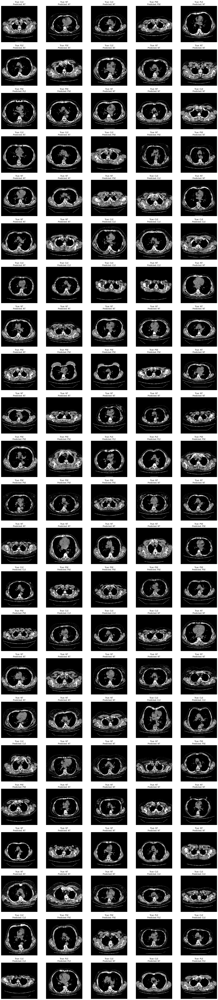

In [ ]:
import matplotlib.pyplot as plt

# Function to display images with predictions
def display_images_with_predictions(images, true_labels, predicted_labels, class_labels, num_images=16):
    num_rows = (num_images + 4) // 5
    plt.figure(figsize=(25, 5 * num_rows))
    for i in range(num_images):
        plt.subplot(num_rows, 5, i + 1)
        plt.imshow(images[i])
        plt.title(f'True: {class_labels[true_labels[i]]}\nPredicted: {class_labels[predicted_labels[i]]}')
        plt.axis('off')
    plt.show()

# Load the images for display
sample_images, sample_labels = next(test_generator)

# Make predictions on the sample images
sample_predictions = model.predict(sample_images)
sample_pred_classes = np.argmax(sample_predictions, axis=1)

# Display the images along with predictions
display_images_with_predictions(sample_images, np.argmax(sample_labels, axis=1), sample_pred_classes, class_labels, num_images=len(sample_images))
